## Baltimore, Maryland - Neighborhoods explored by Number of Crimes and Number of Vacant Buildings

### Introduction to the Problem:

Baltimore, Maryland is a troubled history. Known as "Charm City" Baltimore has lost its charm with a shrinking population, high crime rate, and bleak outlook.

Baltimore has many problems, but also many amenities. Home of both the Baltimore Orioles and Baltimore Ravens it has two large sporting venues near the Inner Harbor.  The Inner Harbor is a popular tourist venue with many sites such as the National Aquarium in Baltimore and the USS Constellation. 

The problem explored in this project is the relationship between the number of vacant buildings in the city of Baltimore and the highest crime areas of Baltimore.  Looking at neighborhood data we will view the neighborhoods that have the highest reported number of crimes and the neighborhoods that have highest number of vacant buildings.  We will also explore the relationship between the two variables. 

Then we will use the Foursquare location data to explore the venues in selected neighborhoods to see what the venue data can tell us about those neighborhoods. 

#### First we import the libraries that we believe we will need for our data analysis

In [2]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis

import json # library to handle JSON files
#!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab

import requests # library to handle requests

# import k-means from clustering stage
from sklearn.cluster import KMeans

#!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library

from matplotlib import pyplot as plt


print('Libraries imported.')

Libraries imported.


### Data Sources

The data sources for this project are the open city data from

<https://data.baltimorecity.gov/>

Specifically the following reports:

<https://data.baltimorecity.gov/Public-Safety/BPD-Part-1-Victim-Based-Crime-Data/wsfq-mvij/data>
<https://data.baltimorecity.gov/Housing-Development/Vacant-Buildings/qqcv-ihn5/data>
<https://data.baltimorecity.gov/Geographic/Neighborhoods/h8i5-gvdz>

Foursquare API

<https://api.foursquare.com>

The focus on comparing neighborhoods we will require that all neighborhood names in our data sources are formatted in the same manner. Furthermore we will need to decide how far back crime data should go in order to count our incidents.  We want to accurately reflect the current feel for a neighborhood.

To reflect the current crime levels of a neighborhood we pulled the crime data for the past calender year (May 09 2019 - May 09 2020). In order to keep the data saved we saved it as an excel.  We now pull the excel into pandas to create a dataframe. 

In [3]:
crime_df = pd.read_excel('Crime.xlsx')
crime_df.head()

,CrimeDate,CrimeTime,CrimeCode,Description,Neighborhood,Longitude,Latitude,Total Incidents
0,2020-05-09,00:25:00,9S,SHOOTING,HARLEM PARK,-76.642829,39.295362,1
1,2020-05-09,16:00:00,7A,AUTO THEFT,BELAIR-EDISON,-76.571622,39.325328,1
2,2020-05-09,00:25:00,3AF,ROBBERY - STREET,HARLEM PARK,-76.642829,39.295362,1
3,2020-05-09,12:30:00,3AJF,ROBBERY - CARJACKING,NaN,-76.647015,39.289473,1
4,2020-05-09,19:00:00,4E,COMMON ASSAULT,IRVINGTON,-76.687571,39.282992,1


In [4]:
crime_df.shape

(43723, 8)

After viewing the data and seeing the size of our data set, we focus on number of incidents per neighborhood.

In [5]:
crime_rate=pd.DataFrame(crime_df['Neighborhood'].value_counts())
crime_rate.head()

,Neighborhood
DOWNTOWN,1683
FRANKFORD,1143
BELAIR-EDISON,936
BROOKLYN,714
INNER HARBOR,620


#### Data Clean-up
One item we noticed was that the neighborhood name was capitalized differently in the three different data sources we used.  Since the Geojson is the most difficult file to change the capitalization style we converted the crime and vacancies data using the "str.title" command into the same format.

In [6]:
crime_rate = crime_rate.reset_index()
crime_rate.columns = ['Neighborhood', 'Crimes']
crime_rate['Neighborhood']=crime_rate['Neighborhood'].str.title()
crime_rate.head()

,Neighborhood,Crimes
0,Downtown,1683
1,Frankford,1143
2,Belair-Edison,936
3,Brooklyn,714
4,Inner Harbor,620


In [7]:
crime_rate.shape

(271, 2)

Do the same for the vacancies data.  The only difference is we did not implement a cut-off date since the date of the vacancy is when it became vacant. Therefore time frame does not affect our analysis.

In [8]:
vacancies_df=pd.read_excel('Vacancies.xlsx')
vacancies_df.head()

,ReferenceID,BuildingAddress,NoticeDate,Neighborhood,PoliceDistrict,Location
0,4156 038 051519,1908 N WOLFE ST,2019-05-15,South Clifton Park,Eastern,"(39.31283286, -76.59206381)"
1,0161 011 083115,2021 W SARATOGA ST,2015-08-31,PENROSE/FAYETTE STREET OUTREACH,WESTERN,"(39.29168352, -76.64982525)"
2,2110 018 111215,2523 ASHTON ST,2015-11-12,MILLHILL,SOUTHWESTERN,"(39.28008546, -76.65555509)"
3,0058 068 121516,1001 APPLETON ST,2016-12-15,Midtown-Edmondson,Western,"(39.30015318, -76.64821098)"
4,4114B032 040909,2604 AISQUITH ST,2009-04-09,Coldstream Homestead Montebello,Notheastern,"(39.3192208, -76.59667272)"


#### Data Clean-Up
The vacancy data has a lot of duplicate values with extra spaces around the neighborhood names.  Therefore we used the "str.strip" command to remove the extra spaces.

In [9]:
vacancies_df['Neighborhood']=vacancies_df['Neighborhood'].str.title()
vacancies_df['Neighborhood']=vacancies_df['Neighborhood'].str.strip()

In [10]:
vacancies_df.shape

(16784, 6)

In [11]:
vacancies_rate=pd.DataFrame(vacancies_df['Neighborhood'].value_counts())

In [12]:
vacancies_rate.head()

,Neighborhood
Broadway East,1110
Carrollton Ridge,788
Sandtown-Winchester,778
Harlem Park,649
Central Park Heights,559


In [13]:
vacancies_rate = vacancies_rate.reset_index()
vacancies_rate.columns = ['Neighborhood', 'Vacancies']
vacancies_rate.head()

,Neighborhood,Vacancies
0,Broadway East,1110
1,Carrollton Ridge,788
2,Sandtown-Winchester,778
3,Harlem Park,649
4,Central Park Heights,559


In [14]:
vacancies_rate.shape

(221, 2)

#### Comparing the two data sets
We see that "crime_rate" has 270 rows while "vacancies_rate" has 220.  This indicates that not all neighborhoods in Baltimore have vacant properties, which makes sense as in any city, there are high-scale areas.

### Further comparison
Now we will create a choropleth map of both the Crime Data and the Vacancies Data to see if any locations jump out at us.

In [15]:
geo=r'Neighborhoods.geojson'

In [16]:
#Baltimore City Lat Long
lat=39.2903848
long= -76.6121893

In [17]:
crime_map=folium.Map(location=[lat,long], zoom_start=11)
crime_map.choropleth(
    geo_data=geo,
    data=crime_rate,
    columns=['Neighborhood', 'Crimes'],
    key_on="feature.properties.name",
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Crime Rates in Baltimore'
)

# display map
crime_map

In [18]:
vacancies_map=folium.Map(location=[lat,long], zoom_start=11)
vacancies_map.choropleth(
    geo_data=geo,
    data=vacancies_rate,
    columns=['Neighborhood', 'Vacancies'],
    key_on="feature.properties.name",
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Number of Vacant Buildings in Baltimore'
)

# display map
vacancies_map

### What the Maps tell us:
We can see that there is not a clear relationship between the two.  The highest crime areas are not the highest vacancy areas.  We can see that some of the medium areas overlap, but with the data we have it is evident that crime does not necessarily follow high vacancy numbers.

### Next Step: What Can We See When Comparing the Numbers?
Now we will add the crime and vacancies numbers to the same dataframe.  This will allow us to explore a few more items.  

In [19]:
cv_rates=pd.merge(crime_rate, vacancies_rate, on="Neighborhood")
cv_rates.head()

,Neighborhood,Crimes,Vacancies
0,Downtown,1683,71
1,Frankford,1143,34
2,Belair-Edison,936,155
3,Brooklyn,714,219
4,Sandtown-Winchester,607,778


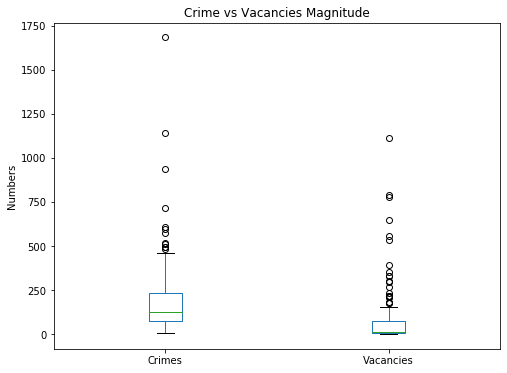

In [20]:
cv_rates.plot(kind='box', figsize=(8, 6))

plt.title('Crime vs Vacancies Magnitude')
plt.ylabel('Numbers')

plt.show()

### Box Plot
The box plot shows us that crime incidents are much higher than the number of vacancies. This way when we view number of vacancies next to the number of crimes we have an idea of what is high.

### Do the Numbers Agree with our Maps?
Lets do a regression plot to see if this visual indicator is accurate

(0, 1767.1115906071927)

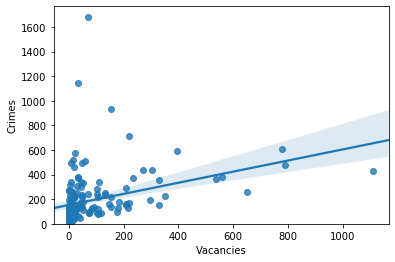

In [58]:
sns.regplot(x="Vacancies", y="Crimes", data=cv_rates)
plt.ylim(0,)

In [59]:
cv_rates[["Vacancies", "Crimes"]].corr()

,Vacancies,Crimes
Vacancies,1.000000,0.344209
Crimes,0.344209,1.000000


### Not a Strong Correlation
The regression plot shows that the correlation is not strong because of the high clustering at the beginning and the relatively flat line. When we run the correlation rate was get a number of 0.344, proving our eye test that there is not a strong correlation between the two variables.

### Clusters
We are going to create some clusters of the neighborhoods based on the number of crimes versus vacancies.

In [21]:
kclusters = 5

cv_clustering = cv_rates.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(cv_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([2, 2, 2, 4, 1, 4, 4, 4, 4, 4], dtype=int32)

In [22]:
cv_rates.insert(0, 'Cluster Labels', kmeans.labels_)

### Defining our Clusters
By grouping our data by the cluster labels and running the mean we can see the average number in each group, helping us see what type of neighborhoods make up our clusters.

In [23]:
cv_rates.groupby('Cluster Labels').mean()

,Crimes,Vacancies
Cluster Labels,,
0,84.902913,17.689320
1,420.000000,736.666667
2,1254.000000,86.666667
3,225.282609,96.260870
4,479.500000,142.000000


| Label | Crime, Vacancy Levels    |
|-------|--------------------------|
|0      | Low Crime, Low Vacancy   |
|1      | High Crime, High Vacancy | 
|2      |Highest Crime, Med Vacancy|
|3      | Med Crime, Med Vacancy   |
|4      | High Crime, Med Vacancy  |

### Map of our Clusters

In [24]:

cv_cluster_map = folium.Map(location=[lat,long], zoom_start=11)


cv_cluster_map.choropleth(
    geo_data=geo,
    data=cv_rates,
    columns=['Neighborhood', 'Cluster Labels'],
    key_on="feature.properties.name",
    fill_color='BuPu', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Location of Clusters in Baltimore',)

cv_cluster_map

### Exploring Neighborhoods with Foursquare
Now let us look at the neighborhoods with most vacancies and crime and see what venues are in them.  First we will pull the top five neighborhoods by the number of vacancies and by the number of crimes.

In [25]:
vacancies_rate.head()

,Neighborhood,Vacancies
0,Broadway East,1110
1,Carrollton Ridge,788
2,Sandtown-Winchester,778
3,Harlem Park,649
4,Central Park Heights,559


In [26]:
vacancies_sort=vacancies_rate.sort_values(by='Vacancies', ascending = False)
top5_vacancies=vacancies_sort.iloc[0:5]
print(top5_vacancies)

           Neighborhood  Vacancies
0         Broadway East       1110
1      Carrollton Ridge        788
2   Sandtown-Winchester        778
3           Harlem Park        649
4  Central Park Heights        559


In [27]:
crime_sort=crime_rate.sort_values(by="Crimes", ascending=False)
top5_crime=crime_sort.iloc[0:5]
print(top5_crime)

    Neighborhood  Crimes
0       Downtown    1683
1      Frankford    1143
2  Belair-Edison     936
3       Brooklyn     714
4   Inner Harbor     620


We will combine the two list to make our "Top 10 Neighborhoods of Interest"

In [28]:
top10=pd.concat([top5_vacancies, top5_crime])
top10=top10.drop('Vacancies', axis=1)
top10=top10.drop('Crimes',axis=1)
print(top10)


           Neighborhood
0         Broadway East
1      Carrollton Ridge
2   Sandtown-Winchester
3           Harlem Park
4  Central Park Heights
0              Downtown
1             Frankford
2         Belair-Edison
3              Brooklyn
4          Inner Harbor


We found the lat, longs for each neighborhood and added them into an Excel spreadsheet.  

In [29]:
top10=pd.read_excel('Top10.xlsx')
top10.head()

,Neighborhood,Lat,Long
0,Broadway East - V,39.3090,-76.5878
1,Carrollton Ridge - V,39.2830,-76.6485
2,Sandtown-Winchester - V,39.3041,-76.6442
3,Harlem Park - V,39.2972,-76.6398
4,Central Park Heights - V,39.3443,-76.6716


### Map
Below are the locations of our top 10 neighborhoods

In [30]:
baltimore_map=folium.Map(location=[lat,long], zoom_start=11)

# add markers to map
for lat, lng, neighborhood in zip(top10['Lat'], top10['Long'], top10['Neighborhood']):
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(baltimore_map)  
    
baltimore_map

### Using Foursqure
Now that we have our neighborhoods of interest and our accompanying coordinates, we will use the Foursquare API to pull our information. We create a function to get nearby venues that will will run with all 10 of our neighborhoods.

In [31]:
CLIENT_ID = 'DV55GDUOOBL2ENGM3T0M53X3BEBEHFQOD002KFYXZTBBBD5Q' # your Foursquare ID
CLIENT_SECRET = 'AIKIXG0HUI2GXD1IIVSESHCAXUKVEFPOHKEXCA3MSM102NBL' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version


In [32]:
def getNearbyVenues(names, latitudes, longitudes, radius=500, LIMIT = 100):
  

    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [33]:

top10_venues = getNearbyVenues(names=top10['Neighborhood'],
                                   latitudes=top10['Lat'],
                                   longitudes=top10['Long']
                                  )

Broadway East - V
Carrollton Ridge - V
Sandtown-Winchester - V
Harlem Park - V
Central Park Heights - V
Downtown - C
Frankford - C
Belair-Edison - C
Brooklyn - C
Inner Harbor - C


In [34]:
top10_venues.groupby('Neighborhood').count()

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,
Belair-Edison - C,12,12,12,12,12,12
Broadway East - V,6,6,6,6,6,6
Brooklyn - C,6,6,6,6,6,6
Carrollton Ridge - V,15,15,15,15,15,15
Central Park Heights - V,5,5,5,5,5,5
Downtown - C,66,66,66,66,66,66
Frankford - C,3,3,3,3,3,3
Harlem Park - V,4,4,4,4,4,4
Inner Harbor - C,72,72,72,72,72,72


In [35]:
print('There are {} uniques categories.'.format(len(top10_venues['Venue Category'].unique())))

There are 92 uniques categories.


In [36]:
top10_onehot = pd.get_dummies(top10_venues[['Venue Category']], prefix="", prefix_sep="")

top10_onehot.head()

,Afghan Restaurant,American Restaurant,Aquarium,Asian Restaurant,BBQ Joint,Bakery,Bank,Bar,Beer Garden,Boat or Ferry,...,Seafood Restaurant,Shipping Store,Spa,Spanish Restaurant,Stadium,Steakhouse,Theater,Tourist Information Center,Vegetarian / Vegan Restaurant,Vietnamese Restaurant
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [37]:
top10_onehot['Neighborhood'] = top10_venues['Neighborhood'] 

In [38]:
top10_onehot.head()

,Afghan Restaurant,American Restaurant,Aquarium,Asian Restaurant,BBQ Joint,Bakery,Bank,Bar,Beer Garden,Boat or Ferry,...,Seafood Restaurant,Shipping Store,Spa,Spanish Restaurant,Stadium,Steakhouse,Theater,Tourist Information Center,Vegetarian / Vegan Restaurant,Vietnamese Restaurant
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [39]:
top10_grouped = top10_onehot.groupby('Neighborhood').mean().reset_index()
top10_grouped

,Neighborhood,Afghan Restaurant,American Restaurant,Aquarium,Asian Restaurant,BBQ Joint,Bakery,Bank,Bar,Beer Garden,...,Seafood Restaurant,Shipping Store,Spa,Spanish Restaurant,Stadium,Steakhouse,Theater,Tourist Information Center,Vegetarian / Vegan Restaurant,Vietnamese Restaurant
0,Belair-Edison - C,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,Broadway East - V,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.166667,0.000000,...,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,Brooklyn - C,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,Carrollton Ridge - V,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.066667,0.000000,0.000000,...,0.133333,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,Central Park Heights - V,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
5,Downtown - C,0.015152,0.015152,0.000000,0.000000,0.015152,0.015152,0.000000,0.015152,0.015152,...,0.015152,0.000000,0.0,0.015152,0.015152,0.000000,0.045455,0.000000,0.015152,0.030303
6,Frankford - C,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,Harlem Park - V,0.000000,0.250000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,Inner Harbor - C,0.000000,0.069444,0.027778,0.013889,0.000000,0.027778,0.041667,0.041667,0.000000,...,0.013889,0.013889,0.0,0.000000,0.000000,0.027778,0.013889,0.013889,0.000000,0.000000
9,Sandtown-Winchester - V,0.000000,0.000000,0.000000,0.000000,0.000000,0.200000,0.000000,0.400000,0.000000,...,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [40]:
num_top_venues = 5

for hood in top10_grouped['Neighborhood']:
    print("----"+hood+"----")
    temp = top10_grouped[top10_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Belair-Edison - C----
                 venue  freq
0  Fried Chicken Joint  0.17
1       Discount Store  0.17
2        Grocery Store  0.08
3   Chinese Restaurant  0.08
4  American Restaurant  0.08


----Broadway East - V----
        venue  freq
0  Public Art  0.17
1         Bar  0.17
2      Lounge  0.17
3        Food  0.17
4        Park  0.17


----Brooklyn - C----
                  venue  freq
0  Fast Food Restaurant  0.33
1        Sandwich Place  0.17
2     Convenience Store  0.17
3           Pizza Place  0.17
4                  Park  0.17


----Carrollton Ridge - V----
                  venue  freq
0    Seafood Restaurant  0.13
1         Grocery Store  0.07
2   Fried Chicken Joint  0.07
3     Fish & Chips Shop  0.07
4  Fast Food Restaurant  0.07


----Central Park Heights - V----
           venue  freq
0  Deli / Bodega   0.2
1            Spa   0.2
2   Liquor Store   0.2
3           Park   0.2
4         Market   0.2


----Downtown - C----
                   venue  freq
0          

In [41]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [43]:
num_top_venues = 5

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
top10_venues_sorted = pd.DataFrame(columns=columns)
top10_venues_sorted['Neighborhood'] = top10_grouped['Neighborhood']

for ind in np.arange(top10_grouped.shape[0]):
    top10_venues_sorted.iloc[ind, 1:] = return_most_common_venues(top10_grouped.iloc[ind, :], num_top_venues)

top10_venues_sorted

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
0,Belair-Edison - C,Fried Chicken Joint,Discount Store,Grocery Store,Chinese Restaurant,Food & Drink Shop
1,Broadway East - V,Lounge,Park,Food,Bar,Chinese Restaurant
2,Brooklyn - C,Fast Food Restaurant,Sandwich Place,Park,Pizza Place,Convenience Store
3,Carrollton Ridge - V,Seafood Restaurant,Grocery Store,Breakfast Spot,Intersection,Fish & Chips Shop
4,Central Park Heights - V,Deli / Bodega,Liquor Store,Park,Spa,Market
5,Downtown - C,Café,Theater,Pizza Place,Coffee Shop,Vietnamese Restaurant
6,Frankford - C,Convenience Store,Indian Restaurant,Chinese Restaurant,Vietnamese Restaurant,Exhibit
7,Harlem Park - V,Park,American Restaurant,Coffee Shop,Vietnamese Restaurant,Exhibit
8,Inner Harbor - C,Hotel,American Restaurant,Sandwich Place,Bar,Bank
9,Sandtown-Winchester - V,Bar,Convenience Store,Bakery,Plaza,Farmers Market


### Observations
There is not a strong correlation between number of vacant buildings and crime incidents in Baltimore neighborhoods.  This was an unexpected result.  